In [5]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import rasterio
import numpy as np
from rasterio.windows import from_bounds
from rasterio.transform import xy
from rasterio.warp import transform_bounds

In [ ]:
cdl_path = "data/2021_30m_cdls.tif"
dataset = rasterio.open(cdl_path)

labels = dataset.read(1)   # matrix of crop labels


In [7]:
# CDL Categorization Code -> Land Cover (Crop Data Layer)
CDL_LABEL_NAMES = {
    1: "Corn", 2: "Cotton", 3: "Rice", 4: "Sorghum", 5: "Soybeans", 6: "Sunflower",
    10: "Peanuts", 11: "Tobacco", 12: "Sweet Corn", 13: "Pop or Orn Corn", 14: "Mint",
    21: "Barley", 22: "Durum Wheat", 23: "Spring Wheat", 24: "Winter Wheat", 25: "Other Small Grains",
    26: "Dbl Crop WinWht/Soybeans", 27: "Rye", 28: "Oats", 29: "Millet", 30: "Speltz",
    31: "Canola", 32: "Flaxseed", 33: "Safflower", 34: "Rape Seed", 35: "Mustard",
    36: "Alfalfa", 37: "Other Hay/Non Alfalfa", 38: "Camelina", 39: "Buckwheat",
    41: "Sugarbeets", 42: "Dry Beans", 43: "Potatoes", 44: "Other Crops", 45: "Sugarcane",
    46: "Sweet Potatoes", 47: "Misc Vegs & Fruits", 48: "Watermelons", 49: "Onions", 50: "Cucumbers",
    51: "Chick Peas", 52: "Lentils", 53: "Peas", 54: "Tomatoes", 55: "Caneberries", 56: "Hops",
    57: "Herbs", 58: "Clover/Wildflowers", 59: "Sod/Grass Seed", 60: "Switchgrass",
    # NON-CROP 61-65
    61: "Fallow/Idle Cropland", 62: "Pasture/Grass", 63: "Forest", 64: "Shrubland", 65: "Barren",
    # CROPS 66-80
    66: "Cherries", 67: "Peaches", 68: "Apples", 69: "Grapes", 70: "Christmas Trees",
    71: "Other Tree Crops", 72: "Citrus", 74: "Pecans", 75: "Almonds", 76: "Walnuts", 77: "Pears",
    # OTHER 81-109
    81: "Clouds/No Data", 82: "Developed", 83: "Water", 87: "Wetlands", 88: "Nonag/Undefined", 92: "Aquaculture",
    # NLCD-DERIVED 110-195
    111: "Open Water", 112: "Perennial Ice/Snow",
    121: "Developed/Open Space", 122: "Developed/Low Intensity", 123: "Developed/Med Intensity", 124: "Developed/High Intensity",
    131: "Barren", 141: "Deciduous Forest", 142: "Evergreen Forest", 143: "Mixed Forest", 152: "Shrubland",
    171: "Grassland Herbaceous", 181: "Pasture/Hay", 190: "Woody Wetlands", 195: "Herbaceous Wetlands",
    # CROPS 195-255
    204: "Pistachios", 205: "Triticale", 206: "Carrots", 207: "Asparagus", 208: "Garlic", 209: "Cantaloupes",
    210: "Prunes", 211: "Olives", 212: "Oranges", 213: "Honeydew Melons", 214: "Broccoli", 215: "Avocados",
    216: "Peppers", 217: "Pomegranates", 218: "Nectarines", 219: "Greens", 220: "Plums", 221: "Strawberries",
    222: "Squash", 223: "Apricots", 224: "Vetch", 225: "Dbl Crop WinWht/Corn", 226: "Dbl Crop Oats/Corn",
    227: "Lettuce", 228: "Dbl Crop Triticale/Corn", 229: "Pumpkins", 230: "Dbl Crop Lettuce/Durum Wht",
    231: "Dbl Crop Lettuce/Cantaloupe", 232: "Dbl Crop Lettuce/Cotton", 233: "Dbl Crop Lettuce/Barley",
    234: "Dbl Crop Durum Wht/Sorghum", 235: "Dbl Crop Barley/Sorghum", 236: "Dbl Crop WinWht/Sorghum",
    237: "Dbl Crop Barley/Corn", 238: "Dbl Crop WinWht/Cotton", 239: "Dbl Crop Soybeans/Cotton",
    240: "Dbl Crop Soybeans/Oats", 241: "Dbl Crop Corn/Soybeans", 242: "Blueberries", 243: "Cabbage",
    244: "Cauliflower", 245: "Celery", 246: "Radishes", 247: "Turnips", 248: "Eggplants", 249: "Gourds",
    250: "Cranberries", 254: "Dbl Crop Barley/Soybeans",
}

get squares of land 

In [8]:
# California (Central Valley — diverse crops)
cal1 = [-121.5, 35.5, -118.5, 38.5]   # big central valley
cal2 = [-122.5, 38.0, -120.5, 40.5]   # north valley extension

# Arkansas (rice-heavy + surrounding diversity)
ar1 = [-92.5, 34.5, -90.0, 36.5]      # main delta (rice strong)
ar2 = [-93.0, 33.5, -89.5, 35.5]      # extended coverage

In [9]:
def reproject_zone(zone, src_crs):
    # zone = [min_lon, min_lat, max_lon, max_lat]
    left, bottom, right, top = zone
    left2, bottom2, right2, top2 = transform_bounds(
        "EPSG:4326", src_crs, left, bottom, right, top
    )
    return [left2, bottom2, right2, top2]

cal1_proj = reproject_zone([-120.0, 36.6, -119.7, 36.9], "EPSG:5070")
cal2_proj = reproject_zone([-122.0, 38.5, -121.8, 39.8], "EPSG:5070")
ar1_proj  = reproject_zone([-91.3, 35.8, -90.9, 36.1], "EPSG:5070")
ar2_proj  = reproject_zone([-91.5, 34.5, -90.5, 35.5], "EPSG:5070")

## sample crop points from cdl 
#### california

In [ ]:
zones = [
    cal1_proj,cal2_proj
]

# ×10 targets
targets = {
    69: 20540,
    3: 20370,
    36: 9740,
    75: 7830,
    204: 6400
}

# ---------------------------
# LOAD CDL
# ---------------------------

with rasterio.open(cdl_path) as src:
    transform = src.transform
    all_samples = []

    # track remaining needed per class
    remaining = targets.copy()

    for zone in zones:
        left, bottom, right, top = zone

        # crop raster to zone
        window = from_bounds(left, bottom, right, top, transform=transform)
        cdl = src.read(1, window=window)

        win_transform = src.window_transform(window)

        # process each crop
        for crop_id, needed in remaining.items():

            if needed <= 0:
                continue

            ys, xs = np.where(cdl == crop_id)

            if len(xs) == 0:
                continue

            # sample up to what's needed
            take = min(len(xs), needed)

            idx = np.random.choice(len(xs), take, replace=False)

            for i in idx:
                x_pix = xs[i]
                y_pix = ys[i]

                lon, lat = xy(win_transform, y_pix, x_pix)

                all_samples.append((lon, lat, crop_id))

            remaining[crop_id] -= take

# ---------------------------
# RESULTS
# ---------------------------

print("Remaining (should be near 0):")
print(remaining)

print("Total samples:", len(all_samples))
cal_samples= all_samples

Remaining (should be near 0):
{69: 0, 3: 0, 36: 0, 75: 0, 204: 0}
Total samples: 64880


#### arkansas

In [ ]:
zones = [
    ar1_proj,ar2_proj
]

# ×10 targets
targets = {
    5: 46770,
    3: 24230,
    1: 15220,
    2: 7620
}

# ---------------------------
# LOAD CDL
# ---------------------------

with rasterio.open(cdl_path) as src:
    transform = src.transform
    all_samples = []

    # track remaining needed per class
    remaining = targets.copy()

    for zone in zones:
        left, bottom, right, top = zone

        # crop raster to zone
        window = from_bounds(left, bottom, right, top, transform=transform)
        cdl = src.read(1, window=window)

        win_transform = src.window_transform(window)

        # process each crop
        for crop_id, needed in remaining.items():

            if needed <= 0:
                continue

            ys, xs = np.where(cdl == crop_id)

            if len(xs) == 0:
                continue

            # sample up to what's needed
            take = min(len(xs), needed)

            idx = np.random.choice(len(xs), take, replace=False)

            for i in idx:
                x_pix = xs[i]
                y_pix = ys[i]

                lon, lat = xy(win_transform, y_pix, x_pix)

                all_samples.append((lon, lat, crop_id))

            remaining[crop_id] -= take

# ---------------------------
# RESULTS
# ---------------------------

print("Remaining (should be near 0):")
print(remaining)

print("Total samples:", len(all_samples))
print(all_samples)
ark_samples= all_samples

Remaining (should be near 0):
{5: 0, 3: 0, 1: 0, 2: 0}
Total samples: 93840
[(np.float64(453444.9306367561), np.float64(1456668.001962485), 5), (np.float64(447684.9306367561), np.float64(1429308.001962485), 5), (np.float64(433644.9306367561), np.float64(1453038.001962485), 5), (np.float64(453774.9306367561), np.float64(1436328.001962485), 5), (np.float64(451524.9306367561), np.float64(1442748.001962485), 5), (np.float64(454974.9306367561), np.float64(1433358.001962485), 5), (np.float64(448314.9306367561), np.float64(1458858.001962485), 5), (np.float64(445374.9306367561), np.float64(1432368.001962485), 5), (np.float64(436674.9306367561), np.float64(1453638.001962485), 5), (np.float64(424344.9306367561), np.float64(1436718.001962485), 5), (np.float64(425214.9306367561), np.float64(1438728.001962485), 5), (np.float64(431214.9306367561), np.float64(1428978.001962485), 5), (np.float64(454704.9306367561), np.float64(1440738.001962485), 5), (np.float64(439164.9306367561), np.float64(1427178.0

# visualization

### California

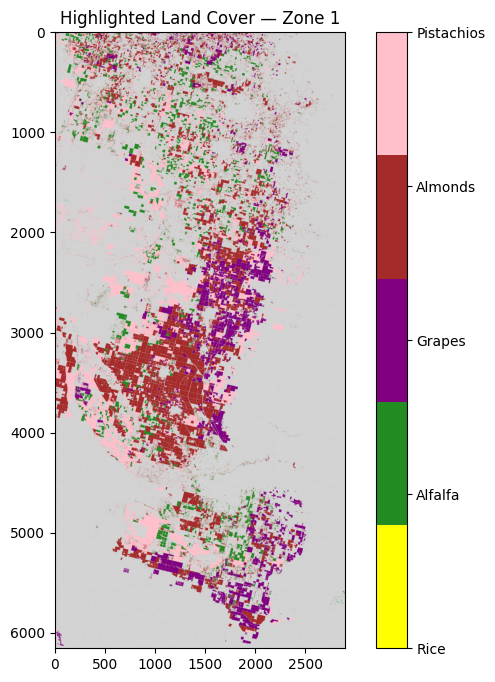

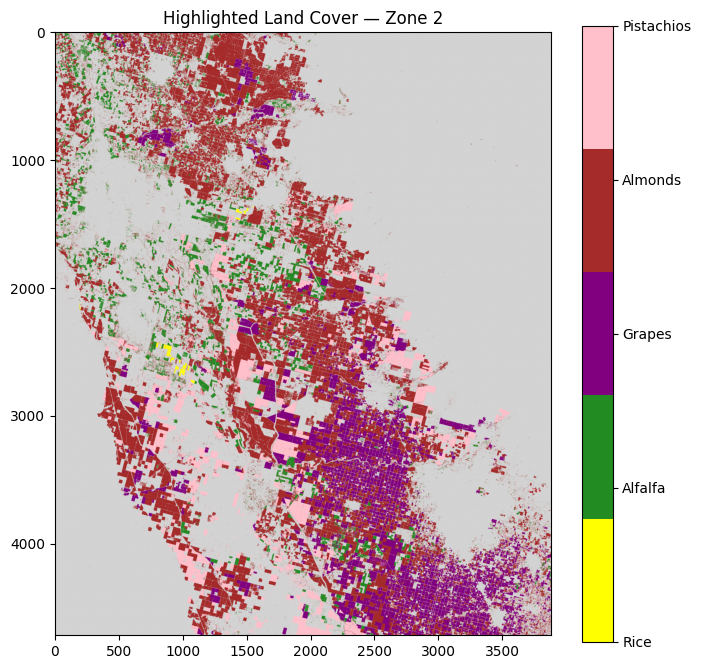

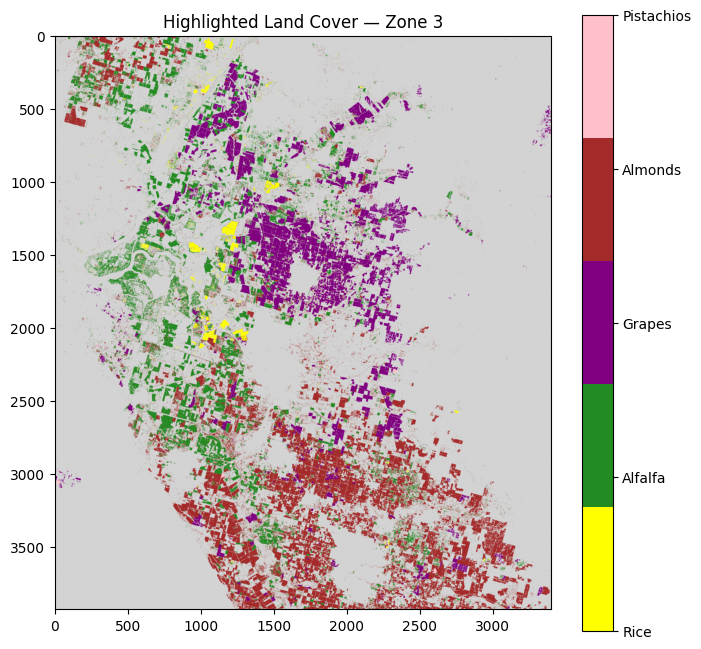

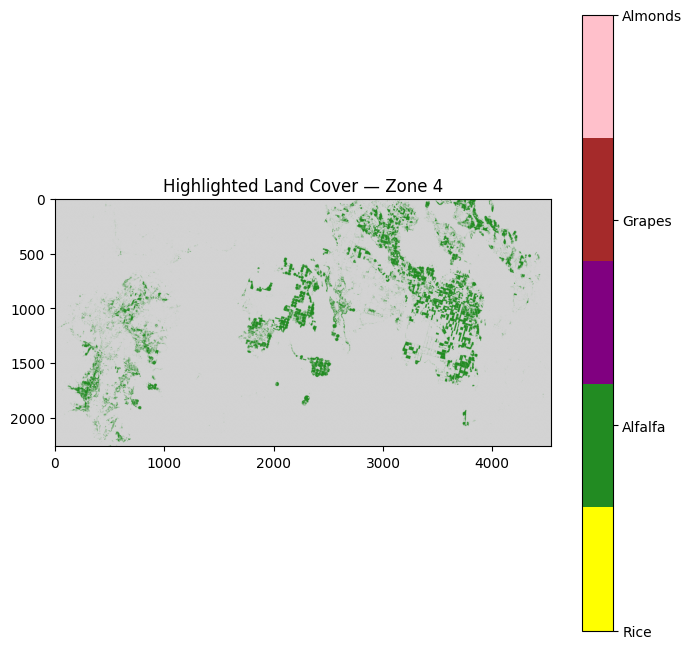

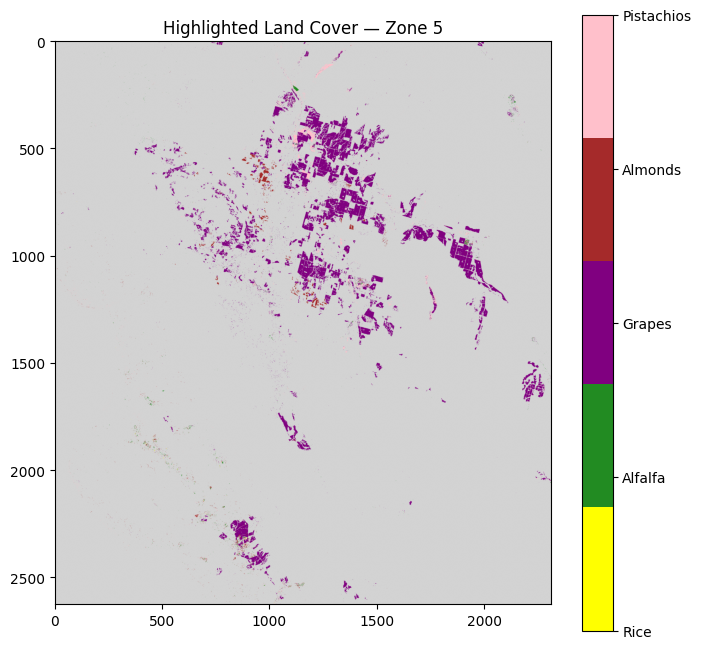

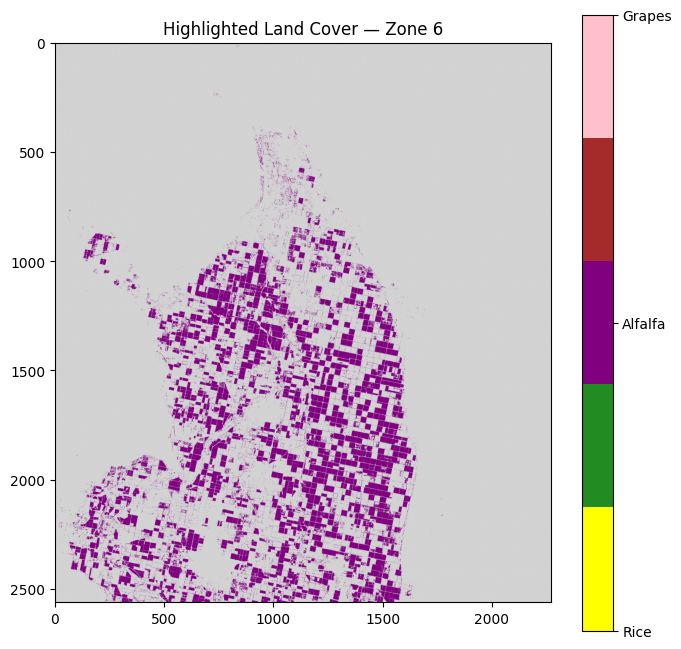

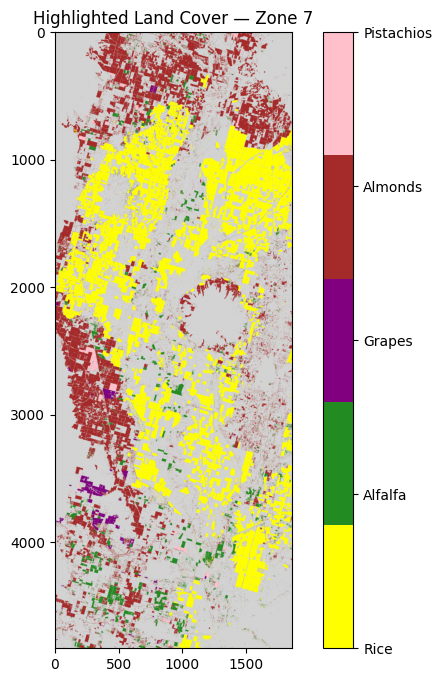

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from rasterio.windows import from_bounds

# List of zones in EPSG:4326 (longitude, latitude)
cal_zones = [
    [-119.5, 34.9, -119, 36.5],    # Salinas Valley
    [-120.8, 36.5, -119.8, 37.6],  # Zone 2
    [-121.7, 37.6, -120.8, 38.5],  # Zone 3
    [-122.7, 41.7, -121.1, 42.0],  # Zone 4
    [-120.9, 35.2, -120.3, 35.8],  # Zone 5
    [-115.8, 32.8, -115.2, 33.4],  # Zone 6
    [-122.0, 38.5, -121.8, 39.8],  # cal2
    
]
# Reproject zones to your dataset CRS (EPSG:5070)
cal_zones_proj = [reproject_zone(zone, "EPSG:5070") for zone in cal_zones]

# Define classes to highlight
highlight_classes = {
    3: 'Rice',
    36: 'Alfalfa',
    69: 'Grapes',
    75: 'Almonds',
    204: 'Pistachios',
}

# Make a colormap
colors = ['yellow', 'forestgreen', 'purple', 'brown', 'pink']
cmap = ListedColormap(colors[:len(highlight_classes)])
cmap.set_under(color='lightgrey')

# Loop over zones
for i, proj_zone in enumerate(cal_zones_proj, start=1):
    window = from_bounds(*proj_zone, transform=dataset.transform)
    subset = dataset.read(1, window=window)

    # Map highlight classes to numbers 1..N, others 0
    highlight_array = np.zeros_like(subset)
    for j, code in enumerate(highlight_classes.keys(), start=1):
        highlight_array[subset == code] = j

    # Plot
    plt.figure(figsize=(8,8))
    plt.imshow(highlight_array, cmap=cmap, vmin=1)
    cbar = plt.colorbar(ticks=range(1, len(highlight_classes)+1))
    cbar.ax.set_yticklabels(list(highlight_classes.values()))
    plt.title(f'Highlighted Land Cover — Zone {i}')
    plt.show()

### Arkansas 

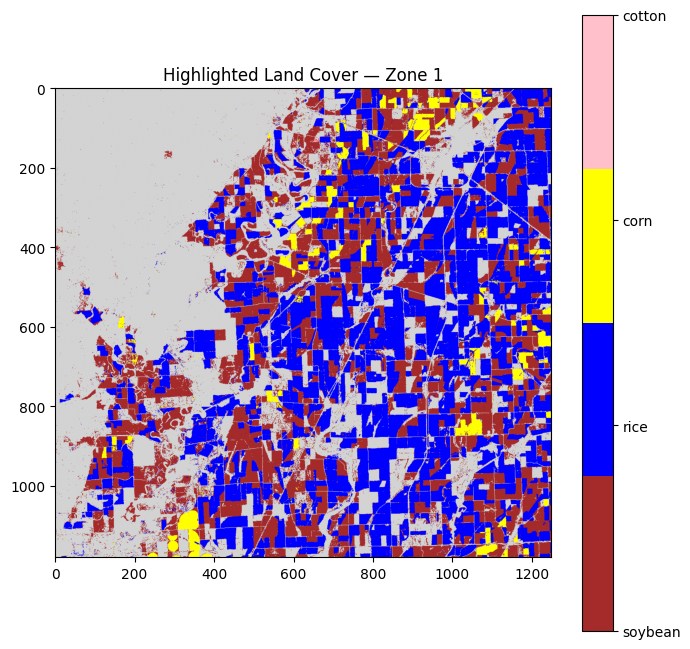

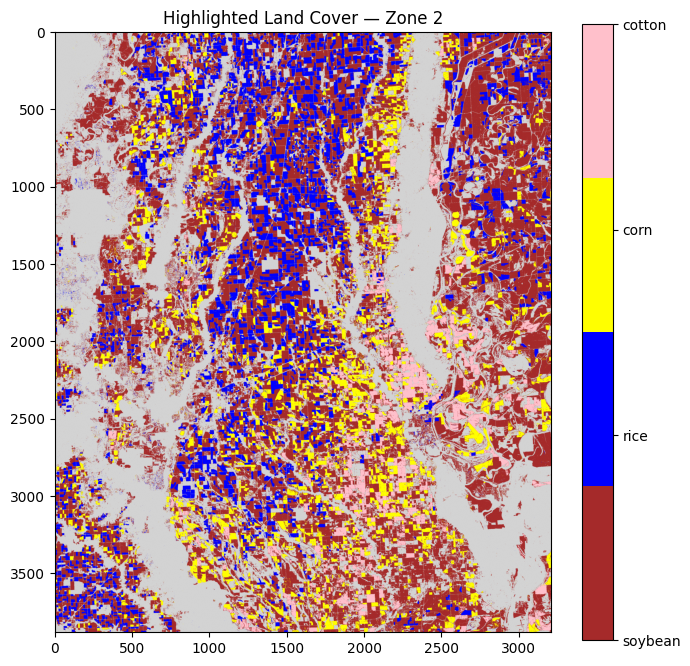

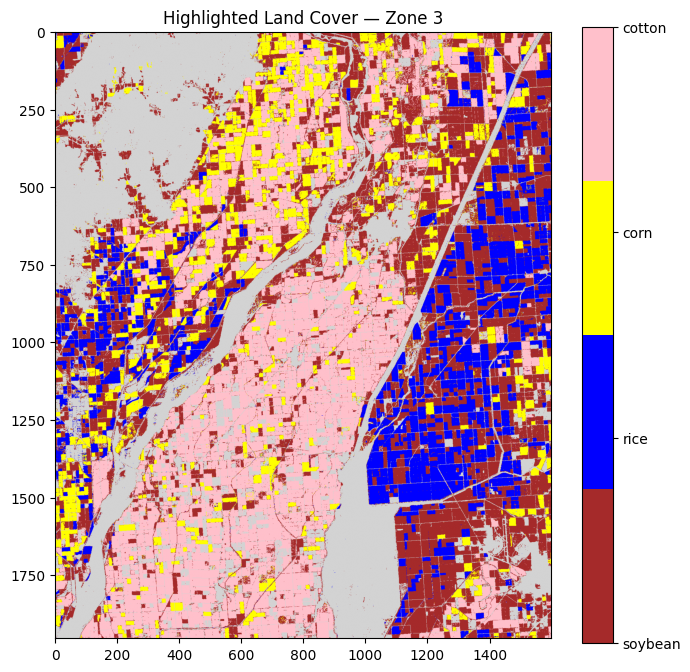

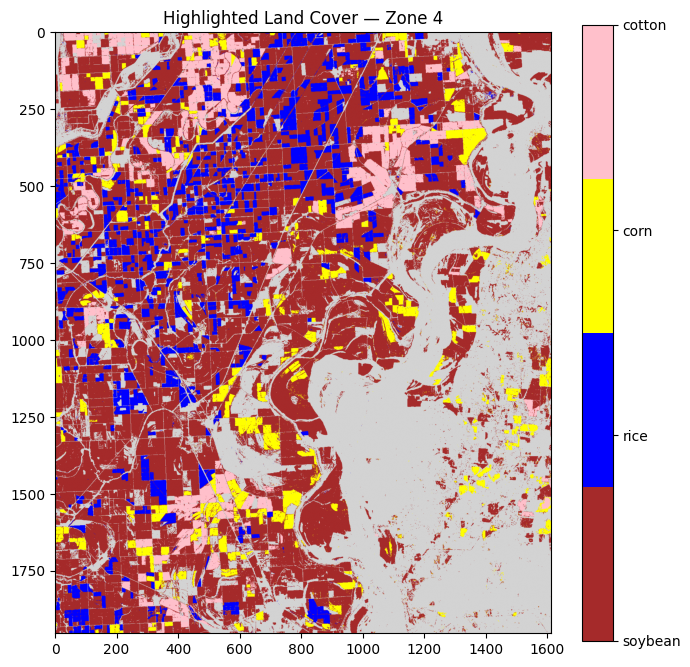

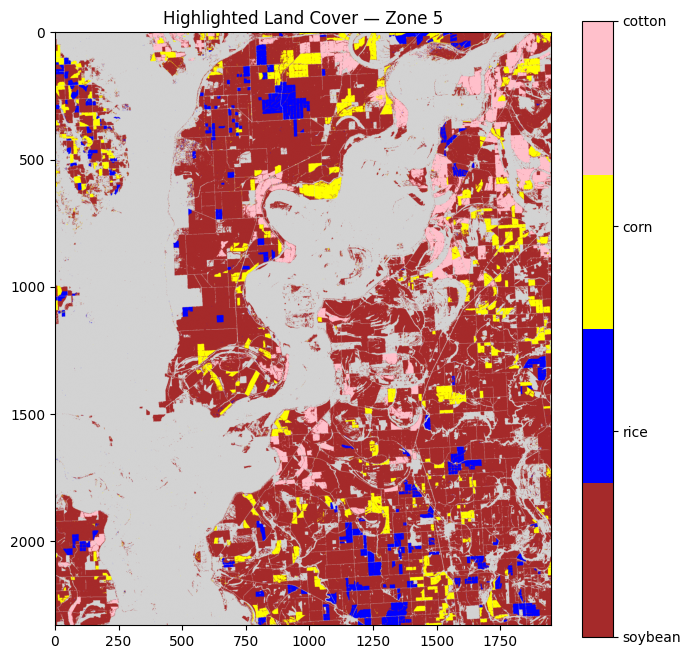

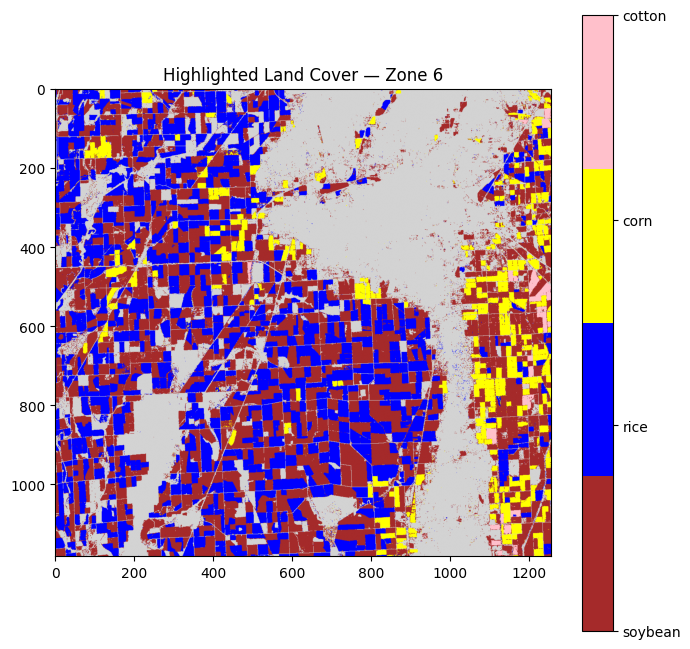

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from rasterio.windows import from_bounds

# List of zones in EPSG:4326 (longitude, latitude)
ark_zones = [
    #batch 1 areas
    [-91.3, 35.8, -90.9, 36.1],    # ar1
    [-91.5, 34.5, -90.5, 35.5],    # ar2
    #batch 2 areas
    [-90.4, 35.9, -89.9, 36.4], 
    [-90.4, 35.2, -89.9, 35.7],  
    [-91.2, 33.8, -90.6, 34.4],  
    [-91.0, 35.6, -90.6, 35.9],  
    
]
# Reproject zones to your dataset CRS (EPSG:5070)
ark_zones_proj = [reproject_zone(zone, "EPSG:5070") for zone in ark_zones]

# Define classes to highlight
highlight_classes = {
    5: 'soybean',
    3: 'rice',
    1: 'corn',
    2: 'cotton',
}

# Make a colormap
colors = ['brown', 'blue', 'yellow', 'pink']
cmap = ListedColormap(colors[:len(highlight_classes)])
cmap.set_under(color='lightgrey')

# Loop over zones
for i, proj_zone in enumerate(ark_zones_proj, start=1):
    window = from_bounds(*proj_zone, transform=dataset.transform)
    subset = dataset.read(1, window=window)

    # Map highlight classes to numbers 1..N, others 0
    highlight_array = np.zeros_like(subset)
    for j, code in enumerate(highlight_classes.keys(), start=1):
        highlight_array[subset == code] = j

    # Plot
    plt.figure(figsize=(8,8))
    plt.imshow(highlight_array, cmap=cmap, vmin=1)
    cbar = plt.colorbar(ticks=range(1, len(highlight_classes)+1))
    cbar.ax.set_yticklabels(list(highlight_classes.values()))
    plt.title(f'Highlighted Land Cover — Zone {i}')
    plt.show()